# Projet: Séparation de Sources

```
Lilian SAY & Jules DECAESTECKER
```

## Problématique

L'objectif de ce projet est d'estimer conjointement la composante voix et la composante bruit d'un enregistrement audio.

On a décidé de travailler sur deux méthodes pour réaliser ce projet :
- La première est basé sur le spectrogramme  (A. Jansson et Al., SINGING VOICE SEPARATION WITH DEEP U-NET
CONVOLUTIONAL NETWORK, ISMIR 2017 );
- la seconde directement sur la forme d'onde (D. Stoller et Al., WAVE-U-NET: A MULTI-SCALE NEURAL NETWORK FOR
  END-TO-END AUDIO SOURCE SEPARATION, ISMIR 2018).


Pour ce projet, plusieurs métriques ont été utilisées afin d'évaluer les performances du modèle, en fonction des différentes étapes de développement :
- Lors de l'entraînement des réseaux de neuronnes, deux fonctions de perte ont été choisie, la Loss L1 et la Mean Squared Error (MSE).
- Pour l'évaluation des différents modèles on utilisera deux métriques qui permettent de quantifier la qualité de séparation des signaux:
 - Signal-to-Noise Ratio - SNR : Cette métrique évalue la qualité des signaux en comparant la puissance du signal utile à celle du bruit indésirable. Un SNR plus élevé indique une meilleure performance dans le cadre de la restauration ou de la séparation de signaux.
 - Scale-Invariant Signal-to-Noise Ratio - SI-SNR : Contrairement au SNR classique, le SI-SNR est invariant à la mise à l'échelle des signaux.

## Jeux de Données

Le projet est composé de trois jeux de données :
- train destiné à nourrir l'entrainement de réseaux de neurones;
- test destiné à évaluer les algorithmes après entrainement;
- train_small qui est beaucoup plus petit que train et destiné à servir de modèle de données dans une phase de prototypage des algorithmes et de la pipeline d'entrainement et qu'on utilisera aussi en ensemble de validation.

Chaque ensemble est consitué de cette façon :
- Un dossier contenant des sous dossier numérotés (exemple 0001 ou 1256);
- Dans chaque sous dossier, trois fichiers wav : mix_snr_XX.wav , voice.wav, noise.wav;
- voice.wav et noise.wav sont les vérités terrain à estimer, mix_snr_XX.wav est le mélange des deux sources avec un SNR de XX pour la composante voix (et de -XX pour la composante bruit).

## Importation et mise en place

In [ ]:
!pip install torchmetrics
!pip install tensorboard

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 34.2 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/drive/MyDrive/test.zip .
!cp -r /content/drive/MyDrive/train.zip .
!cp -r /content/drive/MyDrive/train_small.zip .
!unzip /content/train.zip
!unzip /content/train_small.zip
!unzip /content/test.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
   creating: test/1519/
  inflating: test/1519/voice.wav     
  inflating: test/1519/noise.wav     
  inflating: test/1519/mix_snr_0.wav  
   creating: test/1523/
  inflating: test/1523/voice.wav     
  inflating: test/1523/noise.wav     
  inflating: test/1523/mix_snr_0.wav  
   creating: test/1525/
  inflating: test/1525/voice.wav     
  inflating: test/1525/noise.wav     
  inflating: test/1525/mix_snr_-2.wav  
   creating: test/1526/
  inflating: test/1526/voice.wav     
  inflating: test/1526/noise.wav     
  inflating: test/1526/mix_snr_4.wav  
   creating: test/1528/
  inflating: test/1528/voice.wav     
  inflating: test/1528/noise.wav     
  inflating: test/1528/mix_snr_4.wav  
   creating: test/1531/
  inflating: test/1531/voice.wav     
  inflating: test/1531/noise.wav     
  inflating: test/1531/mix_snr_0.wav  
   creating: test/1533/
  inflating: test/1533/voice.wav     
  inflating: test/1533/no

In [ ]:
import os
import time
import numpy as np
import scipy
from scipy.stats import skew, kurtosis
import IPython.display as ipd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.signal import stft, istft

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.decomposition import FastICA
from sklearn.metrics import mean_squared_error

import torch
import torchaudio
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchmetrics.audio import SignalNoiseRatio, ScaleInvariantSignalNoiseRatio

from torch.utils.tensorboard import SummaryWriter

### Visualisation des données

Commençons par étudier les données :

In [ ]:
fe, audio = scipy.io.wavfile.read('./train_small/0000/mix_snr_3.wav')
ipd.Audio(data=audio, rate=fe)

In [ ]:
# Calculer des statistiques
mean = np.mean(audio)
var = np.var(audio)
skewness = skew(audio)
kurt = kurtosis(audio)

# Créer un DataFrame pour une vue structurée
df_stats = pd.DataFrame({
    'Moyenne': mean,
    'Variance': var,
    'Skewness': skewness,
    'Kurtosis': kurt
}, index=['Sources 1'])

print(df_stats)

            Moyenne  Variance  Skewness  Kurtosis
Sources 1 -0.000126  0.003162 -0.403624  2.446055


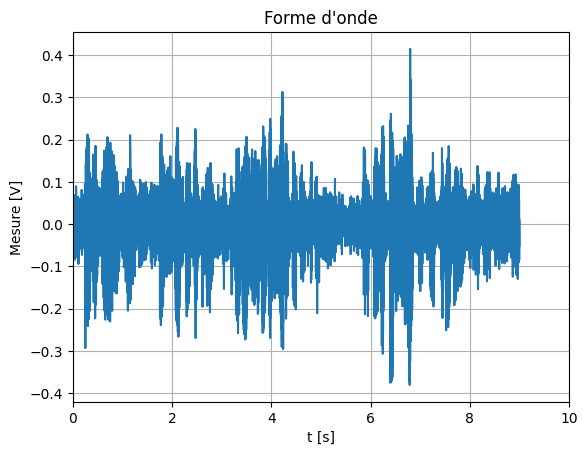

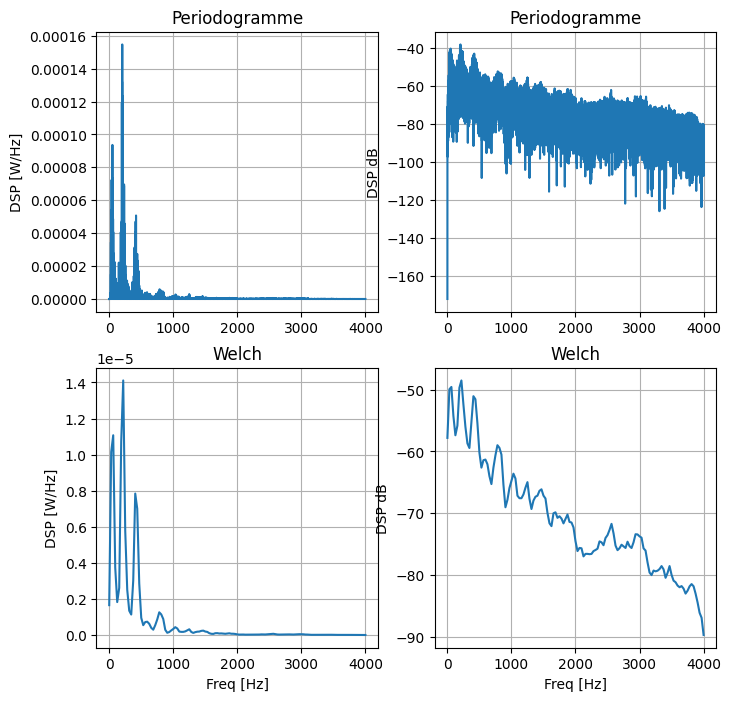

In [ ]:
duree= 10

start = 1*fe
duree_ech = int(duree*fe)

x=audio[start:(start+duree_ech)]

t = np.arange(0, len(x)/fe, 1/fe)

plt.figure()

plt.plot(t,x)
plt.grid('on')
plt.xlabel('t [s]')
plt.ylabel('Mesure [V]')
plt.title("Forme d'onde")
plt.xlim([0,duree])

fw,welch = scipy.signal.welch(audio,fe)
ff,S = scipy.signal.periodogram(audio,fe)

plt.figure(figsize=(8,8))

plt.subplot(221)
plt.plot(ff,np.abs(S))
plt.ylabel('DSP [W/Hz]')
plt.title('Periodogramme')
plt.grid('on')

plt.subplot(222)
plt.plot(ff,10*np.log10(np.abs(S)))
plt.ylabel('DSP dB')
plt.title('Periodogramme')
plt.grid('on')

plt.subplot(223)
plt.plot(fw,np.abs(welch))
plt.ylabel('DSP [W/Hz]')
plt.xlabel('Freq [Hz]')
plt.title('Welch')
plt.grid('on')

plt.subplot(224)
plt.plot(fw,10*np.log10(np.abs(welch)))
plt.xlabel('Freq [Hz]')
plt.ylabel('DSP dB')
plt.title('Welch')
plt.grid('on')

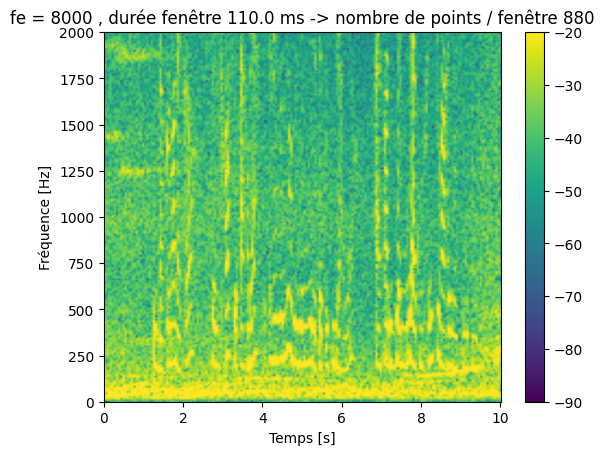

In [ ]:
audio = audio/np.max(np.abs(audio))
audio/=np.std(audio)

duree_segment= 0.11
nperseg= int(duree_segment * fe)
f, t, Zxx = scipy.signal.stft(audio, fe, nperseg=nperseg)
Zxx_log =  20*np.log10(np.abs(Zxx))

plt.figure()
plt.pcolormesh(t, f, Zxx_log, vmax = -20,  vmin=-90,shading='gouraud')
plt.title(f'fe = {fe} , durée fenêtre {duree_segment*1000} ms -> nombre de points / fenêtre {nperseg}')
plt.ylabel('Fréquence [Hz]')
plt.xlabel('Temps [s]')
plt.ylim([0,2000])
plt.colorbar()
plt.show()

## Chargement des données en Pytorch

In [ ]:
class AudioSeparationDataset(Dataset):
  def __init__(self, root_dir):
    self.root_dir = root_dir
    self.data = self._load_data()

  def _load_data(self):
    data = []
    for subfolder in sorted(os.listdir(self.root_dir)):
      subfolder_path = os.path.join(self.root_dir, subfolder)
      if os.path.isdir(subfolder_path):
        mix_path = os.path.join(subfolder_path, [f for f in os.listdir(
            subfolder_path) if f.startswith('mix')][0])
        voice_path = os.path.join(subfolder_path, 'voice.wav')
        noise_path = os.path.join(subfolder_path, 'noise.wav')

        if os.path.exists(mix_path) and os.path.exists(voice_path) and os.path.exists(noise_path):
          data.append({
              "mix": mix_path,
              "voice": voice_path,
              "noise": noise_path
          })
    return data

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    sample = self.data[idx]

    mix, mix_rate = torchaudio.load(sample["mix"])
    voice, voice_rate = torchaudio.load(sample["voice"])
    noise, noise_rate = torchaudio.load(sample["noise"])

    assert mix_rate == voice_rate == noise_rate, "Sample rates do not match!"

    return {
        "mix": mix,
        "voice": voice,
        "noise": noise,
        "sample_rate": mix_rate
    }

In [ ]:
class SpectrogramDataset(Dataset):
    def __init__(self, temporal_dataset, save_dir, output_shape_multiplier=64, nperseg=1024, hop_length=768, patch_size=128):
        self.save_dir = save_dir
        os.makedirs(save_dir, exist_ok=True)

        self.patch_size = patch_size
        self.sample_paths = []

        # Precompute spectrograms and save to disk
        for idx in range(len(temporal_dataset)):
            temporal_sample = temporal_dataset[idx]
            save_path = os.path.join(save_dir, f"spectrogram_{idx}.pt")

            if not os.path.exists(save_path):
                spectrogram_sample, f, t = compute_spectrogram(
                    temporal_sample,
                    output_shape_multiplier=output_shape_multiplier,
                    nperseg=nperseg,
                    hop_length=hop_length,
                )
                torch.save(spectrogram_sample, save_path)
            self.sample_paths.append(save_path)
        self.t = t
        self.f = f


    def __len__(self):
        return len(self.sample_paths)

    def __getitem__(self, idx):
        # Load the precomputed spectrogram from disk
        spectrogram_sample = torch.load(self.sample_paths[idx], weights_only=True)
        return spectrogram_sample

    def get_t_f(self):
        return self.t, self.f



def compute_spectrogram(sample, output_shape_multiplier=64, nperseg=1024, hop_length=768):
    """
    Convertit des données temporelles en spectrogrammes et applique un padding.

    Args:
        sample (dict): Un dictionnaire contenant les données temporelles et "sample_rate".
        output_shape_multiplier (int): Facteur pour le padding.
        nperseg (int): Taille de la fenêtre pour la STFT.
        hop_length (int): Longueur du pas pour la STFT.

    Returns:
        dict: Un dictionnaire contenant les spectrogrammes normalisés.
    """
    sample_rate = sample.get("sample_rate")
    if not sample_rate:
        raise ValueError("Le dictionnaire 'sample' doit contenir une clé 'sample_rate'.")

    spectrogram_sample = {}
    spectrogram_sample["sample_rate"] = sample_rate

    for channel, data in sample.items():
        if channel == "sample_rate":
            continue

        # Calcul de la STFT
        f, t, Zxx = stft(
            data.squeeze().numpy(),
            fs=sample_rate,
            nperseg=nperseg,
            noverlap=nperseg - hop_length,
            nfft=nperseg
        )

        # Magnitude du spectrogramme
        spectrogram = torch.abs(torch.tensor(Zxx))

        # Phase du spectrogramme
        phase = torch.angle(torch.tensor(Zxx))

        # Padding pour garantir que les dimensions sont multiples de output_shape_multiplier
        padded_spectrogram = pad_spectrogram(spectrogram, output_shape_multiplier)

        # Normalisation entre [0, 1]
        normalized_spectrogram = (padded_spectrogram - padded_spectrogram.min()) / \
                                 (padded_spectrogram.max() - padded_spectrogram.min())

        spectrogram_sample[channel] = normalized_spectrogram.unsqueeze(0)  # Ajoute une dimension "channel"
        spectrogram_sample[f"phase_{channel}"] = phase.unsqueeze(0)
    return spectrogram_sample, f, t


def pad_spectrogram(spectrogram, multiplier):
    """
    Applique un padding pour que les dimensions soient divisibles par un facteur donné.

    Args:
        spectrogram (torch.Tensor): Spectrogramme original.
        multiplier (int): Facteur pour les dimensions cibles.

    Returns:
        torch.Tensor: Spectrogramme avec padding.
    """
    pad_x = (spectrogram.shape[0] + multiplier - 1) // multiplier * multiplier
    pad_y = (spectrogram.shape[1] + multiplier - 1) // multiplier * multiplier

    return F.pad(
        spectrogram,
        (0, pad_y - spectrogram.shape[1],  # Padding en largeur
         0, pad_x - spectrogram.shape[0])  # Padding en hauteur
    )

In [ ]:
!rm -rf /content/spectrogram
!mkdir -p spectrogram
!mkdir -p spectrogram/train_small/
!mkdir -p /content/spectrogram/eval/
!mkdir -p /content/spectrogram/test/
!mkdir -p /content/spectrogram/train/

In [ ]:
# Création des datasets et dataloaders
train_temporal_dataset = AudioSeparationDataset(root_dir='train')
train_spectrogram_dataset = SpectrogramDataset(train_temporal_dataset, save_dir="/content/spectrogram/train/")

val_temporal_dataset = AudioSeparationDataset(root_dir='train_small')
val_spectrogram_dataset = SpectrogramDataset(val_temporal_dataset,  save_dir="/content/spectrogram/eval/")

train_spectrogram_loader = DataLoader(train_spectrogram_dataset, batch_size=16,
                          shuffle=True, num_workers=1)
val_spectrogram_loader = DataLoader(val_spectrogram_dataset, batch_size=16,
                        shuffle=False, num_workers=1)

print(f"Nombre d'échantillons dans le dataset d'entrainement: {len(train_temporal_dataset)}")

sample = train_temporal_dataset[0]
print(f"Mix shape: {sample['mix'].shape}")
print(f"Voice shape: {sample['voice'].shape}")
print(f"Noise shape: {sample['noise'].shape}")


Nombre d'échantillons dans le dataset d'entrainement: 5000
Mix shape: torch.Size([1, 80000])
Voice shape: torch.Size([1, 80000])
Noise shape: torch.Size([1, 80000])


In [ ]:
sample = train_spectrogram_dataset[0]
print(f"Mix shape: {sample['mix'].shape}")
print(f"Voice shape: {sample['voice'].shape}")
print(f"Noise shape: {sample['noise'].shape}")

Mix shape: torch.Size([1, 576, 128])
Voice shape: torch.Size([1, 576, 128])
Noise shape: torch.Size([1, 576, 128])


In [ ]:
def reconstruct_waveform(sample, nperseg=1024, hop_length=768):
  """
  Reconstruit le signal temporel à partir du spectrogramme.

  Args:
      sample (dict): Un dictionnaire contenant les données temporelles et "sample_rate".

  Returns:
      torch.Tensor: Signal temporel reconstruit.
  """
  new_sample = sample.copy()
  for channel in ["mix", "voice", "noise", "voice_pred", "noise_pred"]:
    if channel not in sample:
      raise ValueError(f"Le dictionnaire doit contenir la clé '{channel}'.")
    if "_pred" in channel:
      phase = sample["phase_mix"]
    else:
      phase = sample[f"phase_{channel}"]
    phase_shape = phase.shape
    magnitude = sample[channel][:, :phase.shape[1], :phase.shape[2]]


    complex_spectrogram = torch.polar(magnitude, phase)
    # Reconstructed complex spectrogram
    complex_spectrogram_np = complex_spectrogram.numpy()
    # Perform the inverse STFT
    _, reconstructed_waveform = istft(
        complex_spectrogram_np,
        fs=sample["sample_rate"],
        nperseg=nperseg,
        noverlap=nperseg - hop_length,
        nfft=nperseg
    )
    new_sample[f"reconstructed_{channel}"] = reconstructed_waveform
  return new_sample

def show_audios(sample):
  for channel in sample:
    if "reconstructed" in channel:
      print(channel.replace("reconstructed_", ""))
      display(ipd.Audio(data=sample[channel], rate=sample["sample_rate"],))



mix


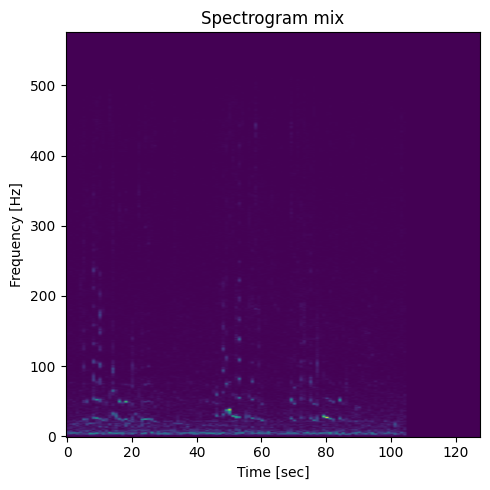

voice


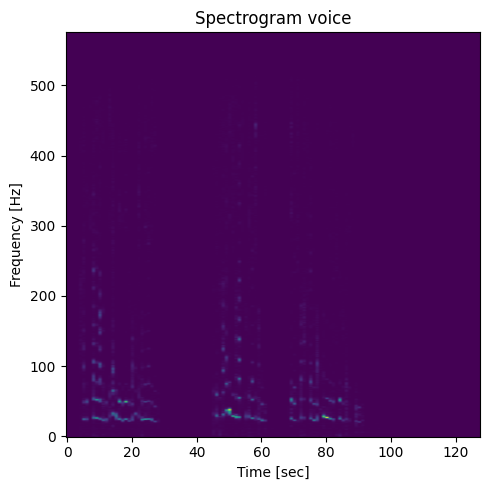

noise


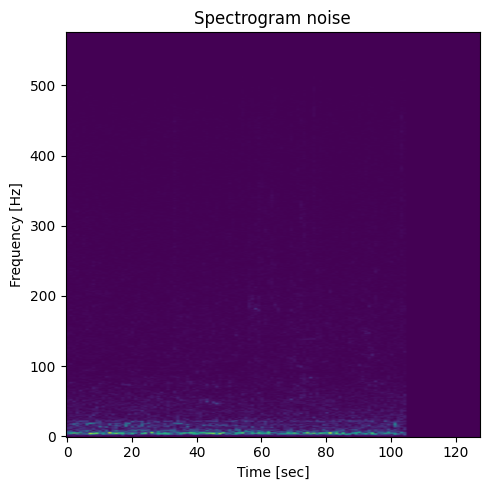

In [ ]:
def show_spectrogram(sample):
  for channel in ["mix", "voice", "noise"]:
      print(channel)
      plt.figure(figsize=(5, 5))
      plt.imshow(sample[channel][0], aspect='auto', cmap='viridis', origin='lower')
      plt.title(f"Spectrogram {channel}")
      plt.ylabel("Frequency [Hz]")
      plt.xlabel("Time [sec]")
      plt.tight_layout()
      plt.show()

sample = train_spectrogram_dataset[0]
show_spectrogram(sample)

## Méthode Baseline

In [ ]:
# calcul des spectrogrammes moyens pour la voix et le bruit
mean_spectrogram_voice = np.zeros_like(train_spectrogram_dataset[0]["mix"])
mean_spectrogram_noise = np.zeros_like(train_spectrogram_dataset[0]["mix"])

for sample in train_spectrogram_dataset:
  mean_spectrogram_voice += sample["voice"].numpy()
  mean_spectrogram_noise += sample["noise"].numpy()

mean_spectrogram_voice /= len(train_spectrogram_dataset)
mean_spectrogram_noise /= len(train_spectrogram_dataset)

In [ ]:
# calcul des puissances moyennes par fréquences
t, f = train_spectrogram_dataset.get_t_f()
collapse_frequency_voice = mean_spectrogram_voice[0, :, :].sum(axis=1)[:f.shape[0]]
collapse_frequency_noise = mean_spectrogram_noise[0, :, :].sum(axis=1)[:f.shape[0]]

# calcul du SNR par fréquence
SNR = collapse_frequency_voice/collapse_frequency_noise

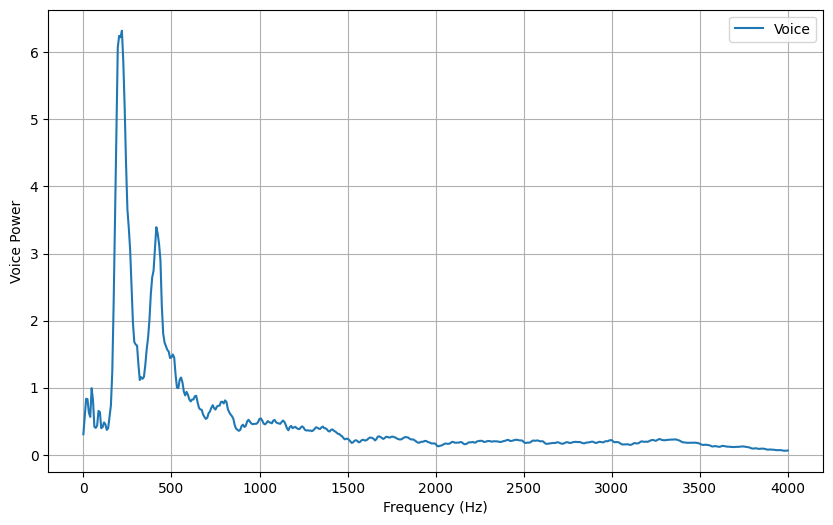

In [ ]:
# graphe de la voix par fréquence
plt.figure(figsize=(10, 6))
plt.plot(f, collapse_frequency_voice, label="Voice")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Voice Power")
plt.grid(True)
plt.legend()
plt.show()

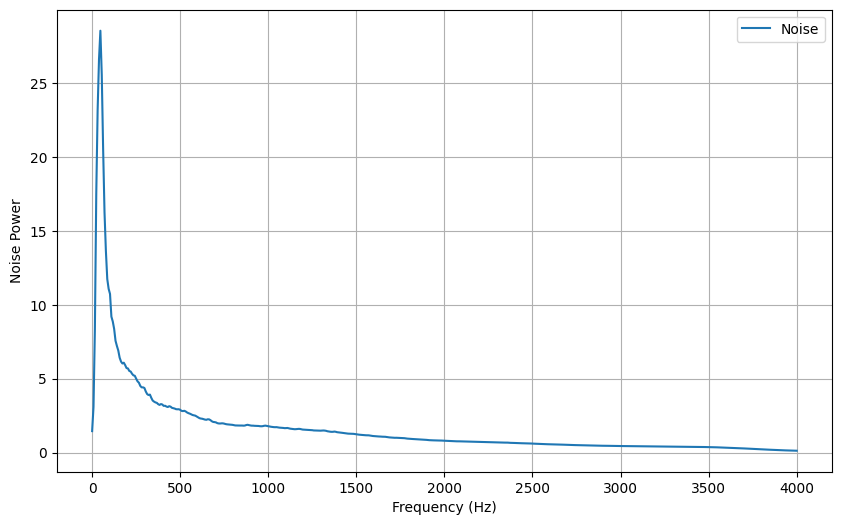

In [ ]:
# graphe du bruit par fréquence
plt.figure(figsize=(10, 6))
plt.plot(f, collapse_frequency_noise, label="Noise")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Noise Power")
plt.grid(True)
plt.legend()
plt.show()

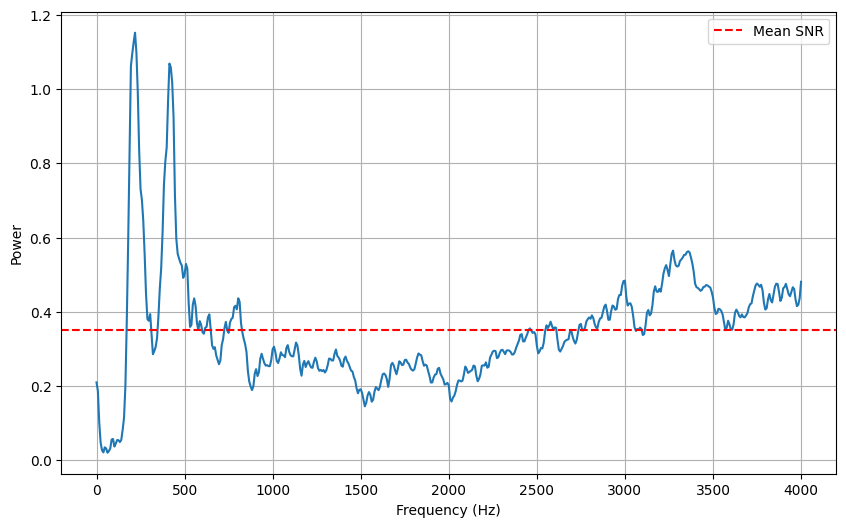

In [ ]:
# graphe du SNR par fréquence
plt.figure(figsize=(10, 6))
plt.plot(f, SNR)
plt.axhline(y=SNR.mean(), color='r', linestyle='--', label='Mean SNR')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def apply_filter(spectrogram, idx_filter):
  new_spectrogram = spectrogram.clone()
  new_spectrogram[:, idx_filter] = 0
  return new_spectrogram

In [ ]:
# choix du seuil
thr = 0.3
idx_filter_voice = np.where(SNR < thr)[0]
idx_filter_noise = np.where(SNR >= thr)[0]

sample = train_spectrogram_dataset[0]

new_sample = { "sample_rate": sample["sample_rate"],
                           "mix": sample["mix"],
                           "phase_mix": sample["phase_mix"],
                           "voice": sample["voice"],
                           "phase_voice": sample["phase_voice"],
                           "noise": sample["noise"],
                           "phase_noise": sample["phase_noise"],
                           "voice_pred": apply_filter(sample["mix"], idx_filter_voice),
                           "noise_pred": apply_filter(sample["mix"], idx_filter_noise)}

new_sample = reconstruct_waveform(new_sample)
show_audios(new_sample)

mix


voice


noise


voice_pred


noise_pred


## Pipeline d'entraînement

In [ ]:
def count_n_param(model):
    return sum([p.numel() for p in model.parameters()])

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, snr_metric, si_snr_metric, writer, num_epochs=50, patience=10, name="waveunet"):
    best_val_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0.0
        epoch_snr_voice = 0.0
        epoch_si_snr_voice = 0.0
        epoch_snr_noise = 0.0
        epoch_si_snr_noise = 0.0
        start_time = time.time()

        for i, batch in enumerate(train_loader):
            mix = batch["mix"].to(device)
            voice = batch["voice"].to(device)
            noise = batch["noise"].to(device)

            optimizer.zero_grad()
            outputs = model(mix)

            true = torch.cat((voice, noise), dim=1)

            loss = criterion(outputs, true)

            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

            snr_voice = snr_metric(outputs[:, 0, :], voice.squeeze(1))
            si_snr_voice = si_snr_metric(outputs[:, 0, :], voice.squeeze(1))

            snr_noise = snr_metric(outputs[:, 1, :], noise.squeeze(1))
            si_snr_noise = si_snr_metric(outputs[:, 1, :], noise.squeeze(1))

            epoch_snr_voice += snr_voice.item()
            epoch_si_snr_voice += si_snr_voice.item()
            epoch_snr_noise += snr_noise.item()
            epoch_si_snr_noise += si_snr_noise.item()


        avg_loss = epoch_loss / len(train_loader)
        avg_snr_voice = epoch_snr_voice / len(train_loader)
        avg_si_snr_voice = epoch_si_snr_voice / len(train_loader)
        avg_snr_noise = epoch_snr_noise / len(train_loader)
        avg_si_snr_noise = epoch_si_snr_noise / len(train_loader)

        writer.add_scalar('Train/Loss', avg_loss, epoch)
        writer.add_scalar('Train/SNR_Voice', avg_snr_voice, epoch)
        writer.add_scalar('Train/SI-SNR_Voice', avg_si_snr_voice, epoch)
        writer.add_scalar('Train/SNR_Noise', avg_snr_noise, epoch)
        writer.add_scalar('Train/SI-SNR_Noise', avg_si_snr_noise, epoch)

        if scheduler:
            scheduler.step(avg_loss)

        end_time = time.time()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.5f}, "
        f"SNR Voice: {avg_snr_voice:.3f} dB, SI-SNR Voice: {avg_si_snr_voice:.3f} dB, "
        f"SNR Noise: {avg_snr_noise:.3f} dB, SI-SNR Noise: {avg_si_snr_noise:.3f} dB, "
        f"Time: {end_time - start_time:.3f}s")

        # Validation
        model.eval()
        val_loss = 0.0
        val_snr_voice = 0.0
        val_si_snr_voice = 0.0
        val_snr_noise = 0.0
        val_si_snr_noise = 0.0

        with torch.no_grad():
            for batch in val_loader:
                mix = batch['mix'].to(device)
                voice = batch['voice'].to(device)
                noise = batch['noise'].to(device)

                outputs = model(mix)

                true = torch.cat((voice, noise), dim=1)

                loss = criterion(outputs, true)
                val_loss += loss.item()

                snr_voice = snr_metric(outputs[:, 0, :], voice.squeeze(1))
                si_snr_voice = si_snr_metric(outputs[:, 0, :], voice.squeeze(1))

                snr_noise = snr_metric(outputs[:, 1, :], noise.squeeze(1))
                si_snr_noise = si_snr_metric(outputs[:, 1, :], noise.squeeze(1))

                val_snr_voice += snr_voice.item()
                val_si_snr_voice += si_snr_voice.item()
                val_snr_noise += snr_noise.item()
                val_si_snr_noise += si_snr_noise.item()

        avg_val_loss = val_loss / len(val_loader)
        avg_val_snr_voice = val_snr_voice / len(val_loader)
        avg_val_si_snr_voice = val_si_snr_voice / len(val_loader)
        avg_val_snr_noise = val_snr_noise / len(val_loader)
        avg_val_si_snr_noise = val_si_snr_noise / len(val_loader)

        writer.add_scalar('Validation/Loss', avg_val_loss, epoch)
        writer.add_scalar('Validation/SNR_Voice', avg_val_snr_voice, epoch)
        writer.add_scalar('Validation/SI-SNR_Voice', avg_val_si_snr_voice, epoch)
        writer.add_scalar('Validation/SNR_Noise', avg_val_snr_noise, epoch)
        writer.add_scalar('Validation/SI-SNR_Noise', avg_val_si_snr_noise, epoch)

        print(f"Validation Loss: {avg_val_loss:.5f}, "
        f"Validation SNR Voice: {avg_val_snr_voice:.3f} dB, Validation SI-SNR Voice: {avg_val_si_snr_voice:.3f} dB, "
        f"Validation SNR Noise: {avg_val_snr_noise:.3f} dB, Validation SI-SNR Noise: {avg_val_si_snr_noise:.3f} dB")

        if epoch%25==0:
            torch.save(model.state_dict(), f'{name}_epoch_{epoch+1}.pth')

        # Early Stopping Check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), f'best_{name}_model.pth')
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping!")
                break

    print("Entraînement terminé.")
    writer.close()


## Méthode 1 : Masque U-Net

[SINGING VOICE SEPARATION WITH DEEP U-NET CONVOLUTIONAL NETWORKS](https://archives.ismir.net/ismir2017/paper/000171.pdf)

- Méthode basée sur le spectrogramme du signal audio
- On entraine un modèle (U-Net) qui prédit le masque de la voix sur le spectrogramme du signal audio
- On applique ensuite ce masque au signal audio pour obtenir la composante voix du spectrogramme
- On applique ensuite la transformée de Fourier inverse pour obtenir le signal audio de la voix

<img src="https://figures.semanticscholar.org/83ea11b45cba0fc7ee5d60f608edae9c1443861d/5-Figure3-1.png" alt="Mask" width="600"/>

- **Architecture du modèle** : U-Net
- **Fonction de coût** : L1
- **Optimiseur** : Adam

<img src="https://figures.semanticscholar.org/83ea11b45cba0fc7ee5d60f608edae9c1443861d/3-Figure1-1.png" alt="Architecture" width="600"/>




In [ ]:

class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
      super(UNet, self).__init__()

      # Encoder: Conv2d -> BatchNorm -> LeakyReLU
      self.encoder1 = self._encoder_block(in_channels, 16)    # 16 channels
      self.encoder2 = self._encoder_block(16, 32)             # 32 channels
      self.encoder3 = self._encoder_block(32, 64)             # 64 channels
      self.encoder4 = self._encoder_block(64, 128)            # 128 channels
      self.encoder5 = self._encoder_block(128, 256)           # 256 channels
      self.bottleneck = self._encoder_block(256, 512)         # Bottleneck: 512 channels

      # Decoder: TransposedConv2d -> BatchNorm -> ReLU -> Dropout
      self.decoder5 = self._decoder_block(512, 256)           # Decoder 5: 256 channels
      self.decoder4 = self._decoder_block(512, 128)           # Decoder 4: 128 channels
      self.decoder3 = self._decoder_block(256, 64)            # Decoder 3: 64 channels
      self.decoder2 = self._decoder_block(128, 32)            # Decoder 2: 32 channels
      self.decoder1 = self._decoder_block(64, 16)             # Decoder 1: 16 channels

      # Final layer
      self.final_conv = nn.ConvTranspose2d(32, out_channels, kernel_size=5, stride=2, padding=2, output_padding=1)
      self.sigmoid = nn.Sigmoid()

    def _encoder_block(self, in_channels, out_channels):
        """
        Encoder block: Conv2d -> BatchNorm -> LeakyReLU.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def _decoder_block(self, in_channels, out_channels, dropout=0.5):
        """
        Decoder block: TransposedConv2d -> BatchNorm -> ReLU -> Dropout (optional).
        """
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        ]
        if dropout > 0.0:
            layers.append(nn.Dropout(dropout))
        return nn.Sequential(*layers)

    def forward(self, x):
      # Encoder path
      enc1 = self.encoder1(x)       # 16 channels
      enc2 = self.encoder2(enc1)    # 32 channels
      enc3 = self.encoder3(enc2)    # 64 channels
      enc4 = self.encoder4(enc3)    # 128 channels
      enc5 = self.encoder5(enc4)    # 256 channels

      bottleneck = self.bottleneck(enc5)  # 512 channels

      # Decoder path with concatenation of skip connections
      dec5 = self.decoder5(bottleneck)    # 256 channels
      dec5 = torch.cat([dec5, enc5], dim=1)  # Concatenate encoder5

      dec4 = self.decoder4(dec5)          # 128 channels
      dec4 = torch.cat([dec4, enc4], dim=1)  # Concatenate encoder4

      dec3 = self.decoder3(dec4)          # 64 channels
      dec3 = torch.cat([dec3, enc3], dim=1)  # Concatenate encoder3

      dec2 = self.decoder2(dec3)          # 32 channels
      dec2 = torch.cat([dec2, enc2], dim=1)  # Concatenate encoder2

      dec1 = self.decoder1(dec2)          # 16 channels
      dec1 = torch.cat([dec1, enc1], dim=1)  # Concatenate encoder1

      # Final convolution and activation
      output = self.final_conv(dec1)
      mask = self.sigmoid(output)
      voice = mask * x
      noise = (1 - mask) * x
      return torch.concat([voice, noise], dim=1)



In [ ]:
# Définir l'appareil (GPU si disponible)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Utilisation de l'appareil : {device}")
model = UNet(1,1).to(device)

count_n_param(model)

Utilisation de l'appareil : cuda


9823313

In [ ]:
# Fonction de perte
criterion = torch.nn.L1Loss() # important pour cette méthode

# Optimiseur
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Scheduler (optionnel)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, 'min', patience=5, factor=0.5, verbose=True)

# Initialiser les métriques
snr_metric = SignalNoiseRatio().to(device)
si_snr_metric = ScaleInvariantSignalNoiseRatio().to(device)

# Initialiser TensorBoard
writer = SummaryWriter('runs/unet_experiment')

In [ ]:
# Entraîner le modèle
train_model(model, train_spectrogram_loader , val_spectrogram_loader, criterion, optimizer, scheduler, snr_metric, si_snr_metric, writer, num_epochs=50, name='unet')

Epoch [1/50], Loss: 0.00404, SNR Voice: 4.726 dB, SI-SNR Voice: 2.235 dB, SNR Noise: 4.405 dB, SI-SNR Noise: 1.596 dB, Time: 62.150s
Validation Loss: 0.00339, Validation SNR Voice: 4.964 dB, Validation SI-SNR Voice: 3.466 dB, Validation SNR Noise: 5.475 dB, Validation SI-SNR Noise: 2.705 dB
Epoch [2/50], Loss: 0.00382, SNR Voice: 5.586 dB, SI-SNR Voice: 3.791 dB, SNR Noise: 4.968 dB, SI-SNR Noise: 2.911 dB, Time: 51.610s
Validation Loss: 0.00330, Validation SNR Voice: 5.097 dB, Validation SI-SNR Voice: 3.670 dB, Validation SNR Noise: 5.759 dB, Validation SI-SNR Noise: 3.093 dB
Epoch [3/50], Loss: 0.00378, SNR Voice: 5.796 dB, SI-SNR Voice: 4.156 dB, SNR Noise: 5.078 dB, SI-SNR Noise: 3.234 dB, Time: 44.768s
Validation Loss: 0.00327, Validation SNR Voice: 5.871 dB, Validation SI-SNR Voice: 4.522 dB, Validation SNR Noise: 5.798 dB, Validation SI-SNR Noise: 3.433 dB
Epoch [4/50], Loss: 0.00376, SNR Voice: 5.930 dB, SI-SNR Voice: 4.378 dB, SNR Noise: 5.148 dB, SI-SNR Noise: 3.459 dB, Time:

## Méthode 2 : Wave-U-Net

Après avoir exploré une première méthode de séparation basée sur les spectrogrammes, nous testons ici un modèle [Wave-UNet](https://arxiv.org/pdf/1806.03185), une approche plus récente qui se distingue par sa capacité à traiter les formes d'onde audio brutes, sans passer par des transformations spectrales comme les spectrogrammes. Inspiré de l'architecture UNet, déjà utilisée en traitement d'images, Wave-UNet adopte un réseau multi-échelle pour mieux capturer les différents aspects des signaux audio à diverses résolutions temporelles. Cette approche end-to-end permet de séparer les différentes sources audio de manière plus directe et souvent plus précise, en traitant les signaux dans leur forme originelle.

<img src="https://figures.semanticscholar.org/cd6e8386c720d929ba46f1665617645f0291d415/2-Figure1-1.png" alt="Architecture_waveunet" width="600"/>

L’objectif avec notre Wave-UNet est de comparer ses performances à celles de la première méthode en matière de qualité de séparation.

In [ ]:
def crop_and_concat(x1, x2):
    crop_x2 = crop(x2, x1.shape[-1])
    x = torch.cat([x1,crop_x2],dim=1)
    return x

def crop(tensor, target_shape):
    shape = tensor.shape[-1]
    diff = shape - target_shape
    crop_start = diff // 2
    crop_end = diff - crop_start
    return tensor[:,:,crop_start:-crop_end]

In [ ]:
class LearnedInterpolationLayer(nn.Module):
    def __init__(self, num_features):
        super(LearnedInterpolationLayer, self).__init__()
        self.weights = nn.Parameter(torch.zeros(num_features))

    def forward(self, x):
        batch_size, num_features, width = x.size()

        weights = torch.sigmoid(self.weights).view(num_features, 1, 1)
        counter_weights = 1.0 - weights

        weight_matrix = torch.cat([weights, counter_weights], dim=2)

        interpolated = F.conv1d(x, weight_matrix, stride=1, groups=num_features)

        output = torch.zeros(batch_size, num_features, 2*width-1, device=x.device)
        output[:, :, ::2] = x
        output[:, :, 1::2] = interpolated

        return output

In [ ]:
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=15, padding='valid'):
        super(EncoderBlock, self).__init__()
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size=kernel_size, padding=padding)
        self.relu = nn.LeakyReLU()
        self.norm = nn.BatchNorm1d(out_channels)

    def forward(self, x):
        skip = x
        skip = self.conv(skip)
        skip = self.norm(skip)
        skip = self.relu(skip)

        out = skip
        out = out[:, :, ::2]
        return out, skip

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=5, stride=1, padding='valid'):
        super(DecoderBlock, self).__init__()

        self.interp_layer = LearnedInterpolationLayer(in_channels)

        self.conv = nn.Conv1d(in_channels+out_channels, out_channels, kernel_size=kernel_size, padding=padding)
        self.norm = nn.BatchNorm1d(out_channels)
        self.relu = nn.LeakyReLU()

    def forward(self, x, skip_connection):
        x = self.interp_layer(x)

        x = crop_and_concat(x, skip_connection)

        x = self.conv(x)
        x = self.norm(x)
        x = self.relu(x)

        return x



In [ ]:
class WaveUNet(nn.Module):
    def __init__(self, L=4, F_c=24, f_d=15, f_u=5, padding='valid'):
        super(WaveUNet, self).__init__()

        self.encoders = nn.ModuleList()
        self.decoders = nn.ModuleList()

        # Encoders
        encoder = EncoderBlock(1, F_c, f_d, padding) # entrée [B, 1, T] / sortie [B, F_c, (T-f_d+1)//2]
        self.encoders.append(encoder)
        for i in range(1, L, 1):
            encoder = EncoderBlock(F_c*i, F_c*(i+1), f_d, padding) # entrée [B, F_c*i, T] / sortie [B, F_c*(i+1), (T-f_d+1)//2)]
            self.encoders.append(encoder)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv1d(F_c*L, F_c*(L+1), kernel_size=f_d, padding=padding),
            nn.BatchNorm1d(F_c*(L+1)),
            nn.LeakyReLU()
            ) # entrée [B, F_c*L, T] / sortie [B, F_c*(L+1), (T-f_d+1)//2]

        # Decoders
        for i in range(L, 0, -1):
            decoder = DecoderBlock(F_c*(i+1), F_c*i, f_u, padding) # entrée [B, F_c*(i+1), T] / sortie [B, F_c*i, 2*T-1]
            self.decoders.append(decoder)

        # Final Convolution
        self.final_conv = nn.Sequential(
            nn.Conv1d(F_c+1, 1, kernel_size=1, padding=0),
            nn.Tanh()
        ) # entrée [B, F_c+1, T] / sortie [B, 1, T]

    def forward(self, input):
        target_length = input.shape[-1]
        skip_connections = []

        x = input
        # Encoders
        for encoder in self.encoders:
            x, skip = encoder(x)
            skip_connections.append(skip)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoders
        for decoder in self.decoders:
            skip_connection = skip_connections.pop()
            x = decoder(x, skip_connection)

        # Final Convolution
        x = crop_and_concat(x, input)
        x = self.final_conv(x)
        y = crop(input, x.shape[-1]) - x
        x = torch.cat([x,y],dim=1)

        if x.size(-1) != target_length:
            if x.size(-1) > target_length:
                x = x[:, :, :target_length]
            else:
                pad_length = target_length - x.size(-1)
                x = F.pad(x, (0, pad_length))
        return x



In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Utilisation de l'appareil : {device}")

model = WaveUNet(4).to(device)
count_n_param(model)

Utilisation de l'appareil : cuda


549722

In [ ]:
criterion = nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5, verbose=True)

In [ ]:
snr_metric = SignalNoiseRatio().to(device)
si_snr_metric = ScaleInvariantSignalNoiseRatio().to(device)

In [ ]:
writer = SummaryWriter('runs/waveunet_experiment')

In [ ]:
train_dataset = AudioSeparationDataset(root_dir='train')
val_dataset = AudioSeparationDataset(root_dir='train_small')

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, snr_metric, si_snr_metric, writer, num_epochs=50)

Epoch [1/50], Loss: 0.00356, SNR Voice: -14.279 dB, SI-SNR Voice: -34.313 dB, SNR Noise: -11.551 dB, SI-SNR Noise: -29.757 dB, Time: 164.411s
Validation Loss: 0.00107, Validation SNR Voice: -13.497 dB, Validation SI-SNR Voice: -33.919 dB, Validation SNR Noise: -9.405 dB, Validation SI-SNR Noise: -28.798 dB
Epoch [2/50], Loss: 0.00093, SNR Voice: -12.511 dB, SI-SNR Voice: -32.996 dB, SNR Noise: -9.807 dB, SI-SNR Noise: -28.412 dB, Time: 161.208s
Validation Loss: 0.00098, Validation SNR Voice: -12.615 dB, Validation SI-SNR Voice: -32.802 dB, Validation SNR Noise: -9.587 dB, Validation SI-SNR Noise: -28.383 dB
Epoch [3/50], Loss: 0.00091, SNR Voice: -12.426 dB, SI-SNR Voice: -32.913 dB, SNR Noise: -9.693 dB, SI-SNR Noise: -28.303 dB, Time: 161.624s
Validation Loss: 0.00091, Validation SNR Voice: -12.744 dB, Validation SI-SNR Voice: -32.463 dB, Validation SNR Noise: -8.946 dB, Validation SI-SNR Noise: -30.038 dB
Epoch [4/50], Loss: 0.00090, SNR Voice: -12.376 dB, SI-SNR Voice: -32.789 dB, 

## Synthèse de résultats

In [ ]:
def eval_model(model, test_loader, criterion, snr_metric, si_snr_metric, device):
    model.eval()
    test_loss = 0.0
    test_snr_voice = 0.0
    test_si_snr_voice = 0.0
    test_snr_noise = 0.0
    test_si_snr_noise = 0.0

    with torch.no_grad():
        for batch in test_loader:
            mix = batch["mix"].to(device)
            voice = batch["voice"].to(device)
            noise = batch["noise"].to(device)

            outputs = model(mix)

            true = torch.cat((voice, noise), dim=1)

            loss = criterion(outputs, true)
            test_loss += loss.item()

            snr_voice = snr_metric(outputs[:, 0, :], voice.squeeze(1))
            si_snr_voice = si_snr_metric(outputs[:, 0, :], voice.squeeze(1))

            snr_noise = snr_metric(outputs[:, 1, :], noise.squeeze(1))
            si_snr_noise = si_snr_metric(outputs[:, 1, :], noise.squeeze(1))

            test_snr_voice += snr_voice.item()
            test_si_snr_voice += si_snr_voice.item()
            test_snr_noise += snr_noise.item()
            test_si_snr_noise += si_snr_noise.item()

    avg_test_loss = test_loss / len(test_loader)
    avg_test_snr_voice = test_snr_voice / len(test_loader)
    avg_test_si_snr_voice = test_si_snr_voice / len(test_loader)
    avg_test_snr_noise = test_snr_noise / len(test_loader)
    avg_test_si_snr_noise = test_si_snr_noise / len(test_loader)

    print(f"Test Loss: {avg_test_loss:.4f}")
    print(f"Test SNR Voice: {avg_test_snr_voice:.2f} dB, Test SI-SNR Voice: {avg_test_si_snr_voice:.2f} dB")
    print(f"Test SNR Noise: {avg_test_snr_noise:.2f} dB, Test SI-SNR Noise: {avg_test_si_snr_noise:.2f} dB")

In [ ]:
def eval_baseline(val_spectrogram_dataset, idx_filter_voice, idx_filter_noise, snr_metric, si_snr_metric):
  avg_test_snr_voice = 0
  avg_test_si_snr_voice = 0
  avg_test_snr_noise = 0
  avg_test_si_snr_noise = 0
  for sample in val_spectrogram_dataset:
    new_sample = { "sample_rate": sample["sample_rate"],
                            "mix": sample["mix"],
                            "phase_mix": sample["phase_mix"],
                            "voice": sample["voice"],
                            "phase_voice": sample["phase_voice"],
                            "noise": sample["noise"],
                            "phase_noise": sample["phase_noise"],
                            "voice_pred": apply_filter(sample["mix"], idx_filter_voice),
                            "noise_pred": apply_filter(sample["mix"], idx_filter_noise)}

    new_sample = reconstruct_waveform(new_sample)
    snr_voice = snr_metric(new_sample["voice_pred"], new_sample["voice"])
    si_snr_voice = si_snr_metric(new_sample["voice_pred"], new_sample["voice"])
    snr_noise = snr_metric(new_sample["noise_pred"], new_sample["noise"])
    si_snr_noise = si_snr_metric(new_sample["noise_pred"], new_sample["noise"])

    avg_test_si_snr_voice += si_snr_voice.item()
    avg_test_snr_voice += snr_voice.item()

    avg_test_si_snr_noise += si_snr_noise.item()
    avg_test_snr_noise += snr_noise.item()

  avg_test_snr_voice /= len(val_spectrogram_dataset)
  avg_test_si_snr_voice /= len(val_spectrogram_dataset)
  avg_test_snr_noise /= len(val_spectrogram_dataset)
  avg_test_si_snr_noise /= len(val_spectrogram_dataset)
  print(f"Test SNR Voice: {avg_test_snr_voice:.2f} dB, Test SI-SNR Voice: {avg_test_si_snr_voice:.2f} dB")
  print(f"Test SNR Noise: {avg_test_snr_noise:.2f} dB, Test SI-SNR Noise: {avg_test_si_snr_noise:.2f} dB")


In [ ]:
def predict(model, test_dataset, device):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(len(test_dataset)):
            sample = test_dataset[i]
            mix = sample["mix"].unsqueeze(0).to(device)

            output = model(mix)
            voice_pred = output[:, 0, :].cpu().detach()
            noise_pred = output[:, 1, :].cpu().detach()
            new_sample = { "sample_rate": sample["sample_rate"],
                           "mix": sample["mix"],
                           "phase_mix": sample["phase_mix"],
                           "voice": sample["voice"],
                           "phase_voice": sample["phase_voice"],
                           "noise": sample["noise"],
                           "phase_noise": sample["phase_noise"],
                           "voice_pred": voice_pred,
                           "noise_pred": noise_pred}
            new_sample = reconstruct_waveform(new_sample)
            predictions.append(new_sample)
    return predictions


### Wave-U-NET

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Utilisation de l'appareil : {device}")

model = WaveUNet(4).to(device)
model.load_state_dict(torch.load('best_waveunet_model.pth'))

criterion = nn.MSELoss()
test_snr_metric = SignalNoiseRatio().to(device)
test_si_snr_metric = ScaleInvariantSignalNoiseRatio().to(device)

test_dataset = AudioSeparationDataset(root_dir='test')
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

eval_model(model, test_loader, criterion, test_snr_metric, test_si_snr_metric, device)

Utilisation de l'appareil : cuda


<ipython-input-38-b672c2cbb69e>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_waveunet_model.pth'))


Test Loss: 0.0008
Test SNR Voice: -12.01 dB, Test SI-SNR Voice: -22.40 dB
Test SNR Noise: -8.79 dB, Test SI-SNR Noise: -18.52 dB


### U-NET

In [ ]:
model = UNet(1,1).to(device)
model.load_state_dict(torch.load('best_unet_model.pth'))

test_snr_metric = SignalNoiseRatio().to(device)
test_si_snr_metric = ScaleInvariantSignalNoiseRatio().to(device)

test_temporal_dataset = AudioSeparationDataset(root_dir='test')
test_spectrogram_dataset = SpectrogramDataset(test_temporal_dataset, save_dir="/content/spectrogram/test/")

test_loader = DataLoader(test_spectrogram_dataset, batch_size=16,
                        shuffle=False, num_workers=1)

eval_model(model, test_loader, criterion, test_snr_metric, test_si_snr_metric, device)

<ipython-input-30-282e0e56bcbe>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_unet_model.pth'))


Test Loss: 0.0002
Test SNR Voice: 6.68 dB, Test SI-SNR Voice: 5.66 dB
Test SNR Noise: 5.53 dB, Test SI-SNR Noise: 4.59 dB


### BASELINE

In [ ]:
test_snr_metric = SignalNoiseRatio()
test_si_snr_metric = ScaleInvariantSignalNoiseRatio()
eval_baseline(test_spectrogram_dataset, idx_filter_voice, idx_filter_noise, test_snr_metric, test_si_snr_metric)

Test SNR Voice: 2.44 dB, Test SI-SNR Voice: 2.35 dB
Test SNR Noise: 1.77 dB, Test SI-SNR Noise: 0.68 dB


#### Synthèse

Nous avons testé trois méthodes donnant des résultats différents :
- Wave-U-Net : SNR VOIX = -12 DB
- Baseline (filtre) : SNR VOIX = +2.4 DB
- U-Net : SNR VOIX = + 6.6 DB

Le modèle U-Net est le meilleur des trois modèles selon la métrique SNR.

Nous pouvons maintenant écouter les prédictions de la voix pour la trois méthodes et avoir une analyse plus qualitatif.

## Visualisations

### Wave-U-Net

In [ ]:
model = WaveUNet(4).to(device)
model.load_state_dict(torch.load('best_waveunet_model.pth'))
sample = test_dataset[0]
mix = sample["mix"].unsqueeze(0).to(device)

output = model(mix)
voice_pred = output[:, 0, :].cpu().detach()

<ipython-input-31-10d58b408219>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_waveunet_model.pth'))


In [ ]:
ipd.Audio(sample["mix"], rate=sample["sample_rate"])

In [ ]:
ipd.Audio(voice_pred, rate=sample["sample_rate"])

Le bruit a été très légèrement amoindri

In [ ]:
ipd.Audio(sample["voice"], rate=sample["sample_rate"])

### U-NET

In [ ]:
model = UNet(1,1).to(device)
model.load_state_dict(torch.load('best_unet_model.pth'))

predictions = predict(model, test_spectrogram_dataset, device)
pred = predictions[0]
ipd.Audio(pred["reconstructed_voice_pred"], rate=pred["sample_rate"])

<ipython-input-35-7891b12c73c5>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_unet_model.pth'))


Le son de la voix semble bien reconstitué, il y a seulement une déformation parasite lié au fait qu'on a gardé le phase du spectrogramme du mix pour reconstituer le signal audio de la voix

In [ ]:
ipd.Audio(pred["reconstructed_voice"], rate=pred["sample_rate"])

### BASELINE

In [ ]:

sample = test_spectrogram_dataset[0]

new_sample = { "sample_rate": sample["sample_rate"],
                           "mix": sample["mix"],
                           "phase_mix": sample["phase_mix"],
                           "voice": sample["voice"],
                           "phase_voice": sample["phase_voice"],
                           "noise": sample["noise"],
                           "phase_noise": sample["phase_noise"],
                           "voice_pred": apply_filter(sample["mix"], idx_filter_voice),
                           "noise_pred": apply_filter(sample["mix"], idx_filter_noise)}

new_sample = reconstruct_waveform(new_sample)
ipd.Audio(new_sample["reconstructed_voice_pred"], rate=new_sample["sample_rate"])

Le bruit a été bien amoindri mais il y a une importante déformation parasite lié au fait qu'on a gardé le phase du spectrogramme du mix pour reconstituer le signal audio de la voix

In [ ]:
ipd.Audio(new_sample["reconstructed_voice"], rate=new_sample["sample_rate"])

In [ ]:
# prompt: zip runs -> runs.zip

!zip -r runs.zip runs

  adding: runs/ (stored 0%)
  adding: runs/unet_experiment/ (stored 0%)
  adding: runs/unet_experiment/events.out.tfevents.1736498926.25b909920840.689.0 (deflated 71%)


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>